**<h1> Manipulating Images </h1>**


Estimated time needed: **60** minutes


<h2>Objectives</h2>


In this lab, you will learn how to manipulate images, both as arrays and PIL image objects. You will learn how to copy an image to avoid aliasing. We will cover flipping images and cropping images. You will also learn to change pixel images; this will allow you to draw shapes, write text and superimpose images over other images.


<ul>
    <li><a href='#MI'>Manipulating Images </a>
        <ul>
            <li>Copying Images  </li>
            <li>Fliping Images </li>
            <li>Cropping an Image </li>
            <li>Changing Specific Image Pixels </li>
     
  
    
</ul>


----


Download the images for the lab:


In [3]:
import urllib.request  
# Import module urllib.request dùng để gửi request HTTP (tải dữ liệu từ Internet)

urls = [
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png",
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png",
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cat.png"
]
# Danh sách các URL chứa đường dẫn đến các file ảnh cần tải

names = ["lenna.png", "baboon.png", "cat.png"]
# Danh sách tên file tương ứng để lưu ảnh sau khi tải về

for url, name in zip(urls, names):
    # zip() ghép từng URL với từng tên file theo cặp
    # Ví dụ: (urls[0], names[0]), (urls[1], names[1]), ...

    urllib.request.urlretrieve(url, name)
    # Gửi request tới URL để tải dữ liệu
    # Sau đó lưu dữ liệu đó thành file với tên 'name' trên máy

print("Downloaded!")
# In thông báo khi tất cả các file đã được tải xong

Downloaded!


We will be using these imported functions in the lab:


In [9]:
import matplotlib.pyplot as plt   # Thư viện matplotlib: dùng để vẽ đồ thị và hiển thị ảnh
from PIL import Image             # Thư viện PIL (Pillow): dùng để mở, xử lý ảnh (PNG, JPG, ...)
import numpy as np                # Thư viện NumPy: dùng để xử lý ảnh dưới dạng mảng số (ma trận)

## Copying Images


If you want to reassign an array to another variable, you should use the `copy` method. 


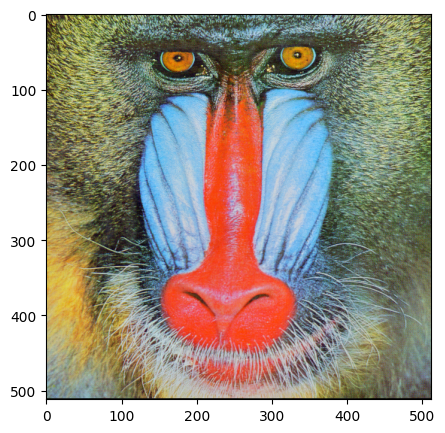

In [10]:
# Mở file ảnh 'baboon.png' bằng thư viện PIL,
# sau đó chuyển ảnh sang mảng NumPy (ma trận pixel)
baboon = np.array(Image.open('baboon.png'))

# Tạo một khung hiển thị (figure) mới với kích thước 5x5 inch
plt.figure(figsize=(5,5))

# Hiển thị ảnh từ mảng NumPy
# matplotlib hiểu ảnh ở định dạng RGB nên hiển thị đúng màu
plt.imshow(baboon)

# Hiển thị cửa sổ ảnh ra màn hình
plt.show()

If we do not apply the method `copy()`, the two variables would point to the same location in memory:


In [11]:
A = baboon   # Gán biến A trỏ tới cùng mảng NumPy với biến baboon (KHÔNG tạo bản sao mới)

We use the  `id`  function to find a variable's memory address; we see the objects in the memory space which the variables `A` and `baboon` point to are the same.


In [12]:
id(A) == id(baboon)   # So sánh địa chỉ bộ nhớ của A và baboon

True

However, if we apply method `copy()`, their memory addresses are different.


In [13]:
B = baboon.copy()     # Tạo một bản sao độc lập của mảng baboon (sao chép dữ liệu sang vùng nhớ mới)

id(B) == id(baboon)   # So sánh địa chỉ bộ nhớ của B và baboon

False

There may be unexpected behaviours when two variables point to the same object in memory. Consider the array `baboon`. If we set all its entries to zero, all entires in `A` will become zero as well. However, as `baboon` and `B` points to different objects, the values in `B` will not be affected. 


In [14]:
baboon[:, :, :] = 0    # Gán giá trị 0 cho toàn bộ pixel của ảnh baboon (mọi hàng, mọi cột, mọi kênh màu)

We can compare the variables <code>baboon</code> and array <code>A</code>:


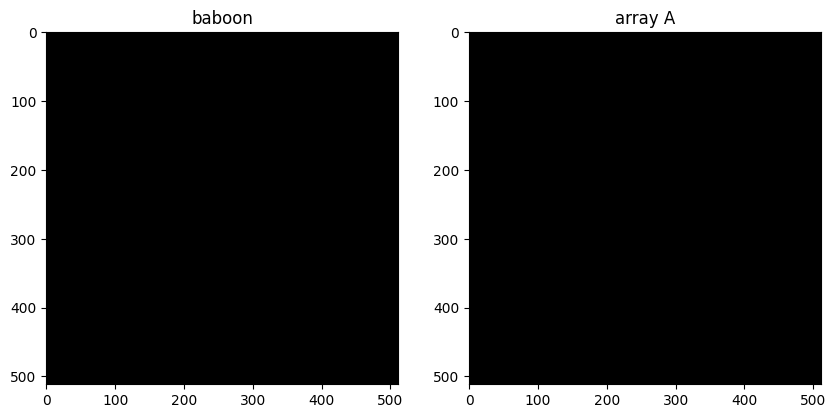

In [15]:
plt.figure(figsize=(10,10))    # Tạo một figure mới có kích thước 10x10 inch để chứa nhiều hình con

plt.subplot(121)               # Chia figure thành 1 hàng, 2 cột và chọn ô thứ 1 (bên trái)
plt.imshow(baboon)             # Hiển thị ảnh baboon
plt.title("baboon")            # Đặt tiêu đề cho ảnh thứ nhất

plt.subplot(122)               # Chia figure thành 1 hàng, 2 cột và chọn ô thứ 2 (bên phải)
plt.imshow(A)                  # Hiển thị ảnh A
plt.title("array A")           # Đặt tiêu đề cho ảnh thứ hai

plt.show()                     # Render và hiển thị toàn bộ figure ra màn hình

We see they are the same. This behaviour is called aliasing. Aliasing happens whenever one variable's value is assigned to another variable. Variables are references to values on the memory. 

We can also compare <code>baboon</code> and array <code>B</code>:


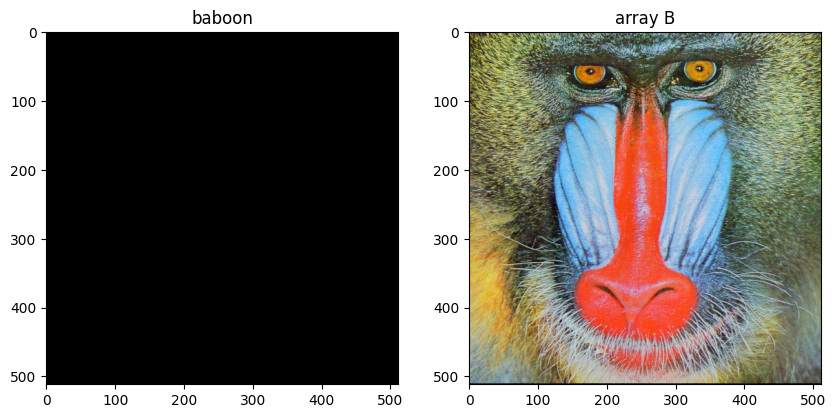

In [16]:
plt.figure(figsize=(10,10))     # Tạo một figure mới có kích thước 10x10 inch

plt.subplot(121)               # Chia figure thành 1 hàng, 2 cột và chọn ô thứ 1 (bên trái)
plt.imshow(baboon)             # Hiển thị ảnh baboon (đã bị chỉnh sửa trước đó)
plt.title("baboon")            # Đặt tiêu đề cho ảnh thứ nhất

plt.subplot(122)               # Chia figure thành 1 hàng, 2 cột và chọn ô thứ 2 (bên phải)
plt.imshow(B)                  # Hiển thị ảnh B (bản sao độc lập được copy trước khi baboon bị thay đổi)
plt.title("array B")           # Đặt tiêu đề cho ảnh thứ hai

plt.show()                     # Render và hiển thị toàn bộ figure ra màn hình


If a PIL function does not return a new image, the same principle applies. We will go over some examples later on. 


## Flipping Images 


Flipping images involves reordering the indices of the pixels such that it changes the orientation of the image. Consider the following image:


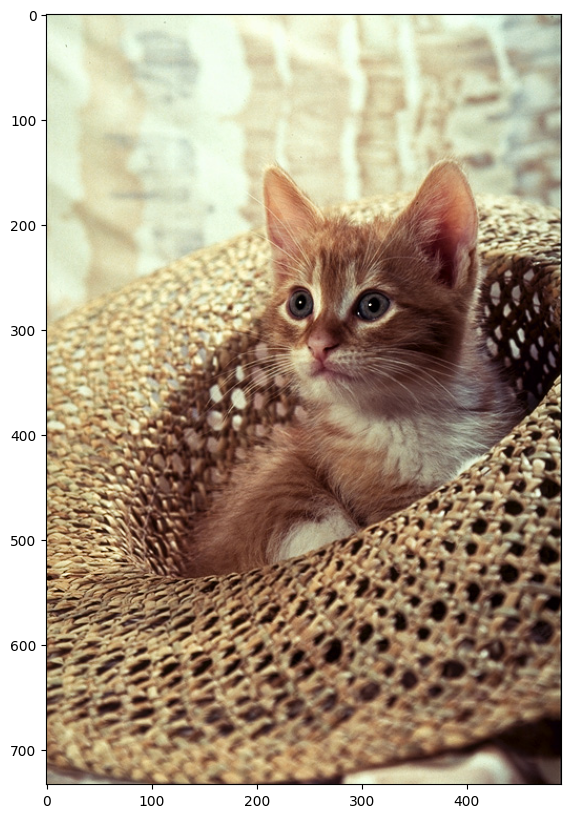

In [17]:
image = Image.open("cat.png")   # Mở file ảnh 'cat.png' bằng thư viện PIL,
                               # tạo đối tượng ảnh (PIL Image) ở định dạng RGB

plt.figure(figsize=(10,10))    # Tạo một figure mới với kích thước 10x10 inch

plt.imshow(image)              # Hiển thị ảnh bằng matplotlib,
                               # matplotlib tự động hiểu đối tượng PIL Image

plt.show()                     # Render và hiển thị ảnh ra màn hình

We can cast it to an array and find its shape:


In [18]:
array = np.array(image)            # Chuyển đối tượng ảnh PIL Image thành mảng NumPy (ma trận pixel)

width, height, C = array.shape     # Lấy kích thước mảng ảnh:
                                   # width  : số hàng (chiều cao ảnh)
                                   # height : số cột (chiều rộng ảnh)
                                   # C      : số kênh màu (thường là 3 cho RGB)

print('width, height, C', width, height, C)  # In ra kích thước ảnh và số kênh màu

width, height, C 733 490 3


Let's flip, i.e rotate vertically, the image. Let's try the traditional approach. First, we create an array of the same size with datatype <code>np.uint8</code>.


In [19]:
array_flip = np.zeros((width, height, C), dtype=np.uint8)
# Tạo một mảng NumPy mới có kích thước (width, height, C)
# - width  : số hàng của ảnh
# - height : số cột của ảnh
# - C      : số kênh màu (RGB)
# Mọi phần tử ban đầu đều có giá trị 0 → ảnh đen
# dtype=np.uint8 → mỗi pixel dùng 8 bit (0–255), đúng chuẩn ảnh

We assign the first row of pixels of the original array to the new array’s last row. We repeat the process for every row, incrementing the row number from the original array and decreasing the new array’s row index to assign the pixels accordingly. After excecuting the for loop below, `array_flip` will become the flipped image. 


In [20]:
for i, row in enumerate(array):
    # enumerate(array):
    # - i   : chỉ số của hàng (row index), chạy từ 0 → width-1
    # - row : toàn bộ 1 hàng pixel của ảnh, kích thước (height, C)

    array_flip[width - 1 - i, :, :] = row
    # Gán hàng 'row' vào vị trí đối xứng trong array_flip
    # width - 1 - i:
    #   - Đảo ngược thứ tự các hàng
    #   - Hàng đầu (i=0) → hàng cuối
    #   - Hàng cuối → hàng đầu
    # :, :  → giữ nguyên tất cả cột và tất cả kênh màu (RGB)

<code>PIL</code> has several ways to flip an image, for example, we can use the <code>ImageOps</code> module:


In [24]:
from PIL import ImageOps   # Import module ImageOps của Pillow để thực hiện các phép biến đổi ảnh cơ bản

The `flip()` method of `ImageOps` module flips the image. The `mirror()` method will mirror  the image:


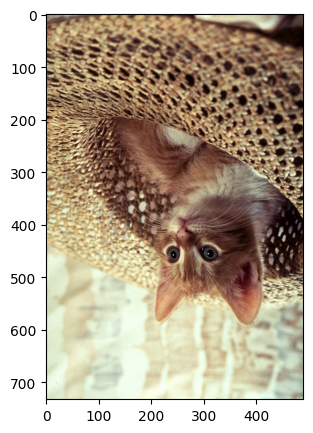

In [23]:
im_flip = ImageOps.flip(image)   # Lật ảnh theo chiều dọc (trên ↔ dưới) bằng PIL ImageOps

plt.figure(figsize=(5,5))        # Tạo figure mới với kích thước 5x5 inch

plt.imshow(im_flip)              # Hiển thị ảnh đã bị lật
                                 # matplotlib tự động hiểu đối tượng PIL Image

plt.show()                       # Render và hiển thị ảnh ra màn hình

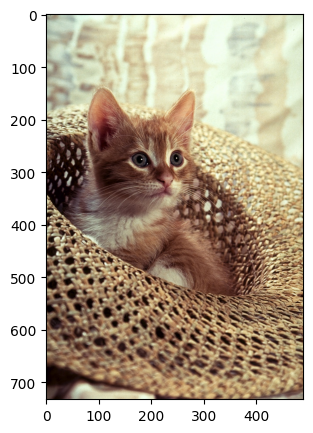

In [ ]:
im_mirror = ImageOps.mirror(image)   # Lật ảnh theo chiều ngang (trái-phải), tạo hiệu ứng soi gương

plt.figure(figsize=(5,5))            # Tạo figure mới với kích thước 5x5 inch

plt.imshow(im_mirror)                # Hiển thị ảnh đã bị lật ngang
                                     # matplotlib tự động hiểu đối tượng PIL Image

plt.show()                           # Render và hiển thị ảnh ra màn hình

We can use  the <code>transpose()</code> method; the parameter is an integer indicating what type of transposition we would like to perform. For example, we can flip the image using a value of `1`.


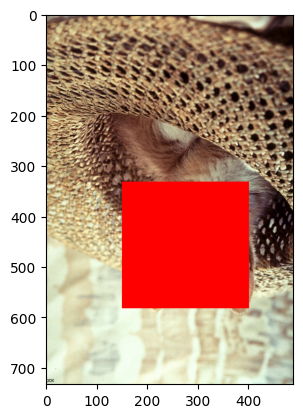

In [ ]:
im_flip = image.transpose(1)   # Lật ảnh theo chiều dọc (trên-dưới)
                               # Ở đây số 1 tương ứng với Image.FLIP_TOP_BOTTOM

plt.imshow(im_flip)            # Hiển thị ảnh đã bị lật dọc
plt.show()                     # Render và hiển thị ảnh

The Image module has built-in attributes that describe the type of flip. The values are just integers. Several are shown in the following <code>dict</code>:


In [ ]:
flip = {
    "FLIP_LEFT_RIGHT": Image.FLIP_LEFT_RIGHT,   # Lật ảnh theo chiều ngang (trái-phải)
    "FLIP_TOP_BOTTOM": Image.FLIP_TOP_BOTTOM,   # Lật ảnh theo chiều dọc (trên-dưới)

    "ROTATE_90": Image.ROTATE_90,               # Xoay ảnh 90° ngược chiều kim đồng hồ
    "ROTATE_180": Image.ROTATE_180,             # Xoay ảnh 180°
    "ROTATE_270": Image.ROTATE_270,             # Xoay ảnh 270°

    "TRANSPOSE": Image.TRANSPOSE,               # Xoay ảnh qua đường chéo chính (kết hợp flip + rotate)
    "TRANSVERSE": Image.TRANSVERSE              # Xoay ảnh qua đường chéo phụ (đối xứng chéo ngược)
}

We see the values are integers.


In [ ]:
flip["FLIP_LEFT_RIGHT"]   # Truy xuất giá trị trong dictionary 'flip' theo key "FLIP_LEFT_RIGHT"

0

We can plot each of the outputs using the different  parameter values:


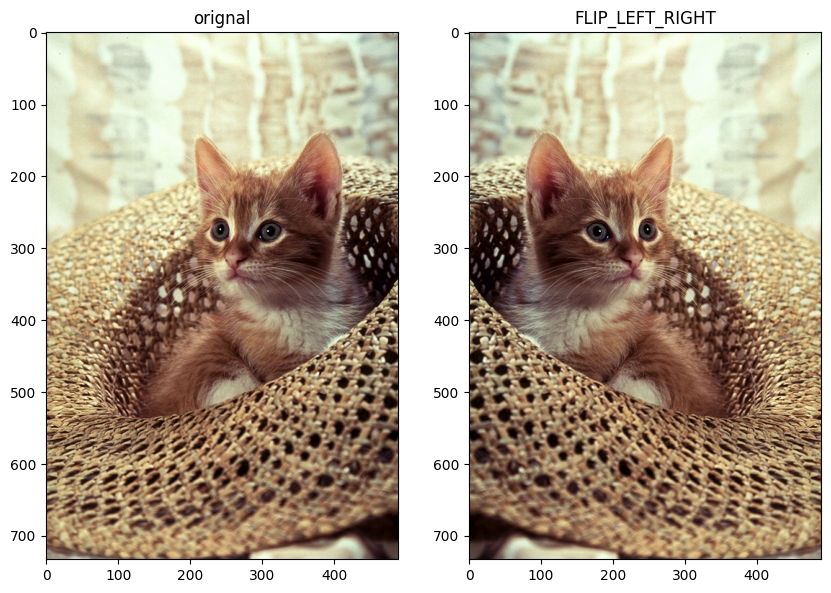

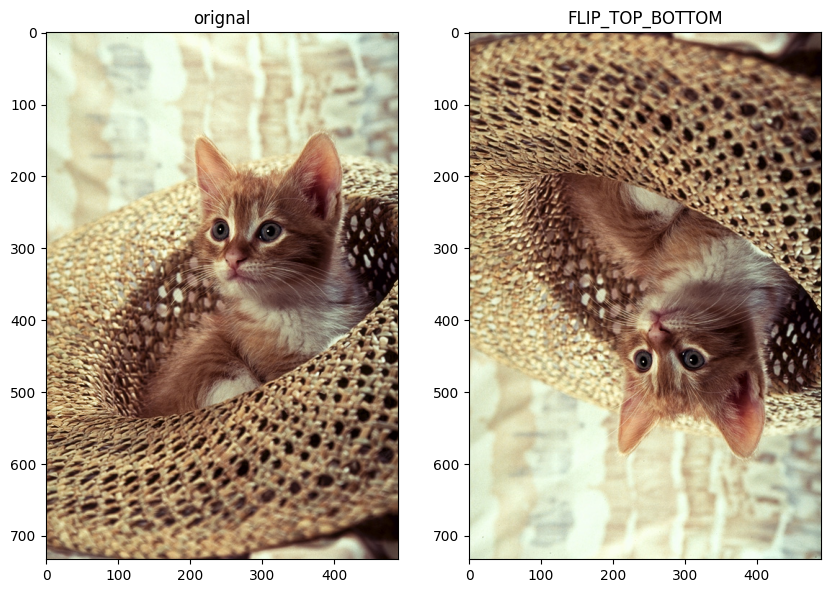

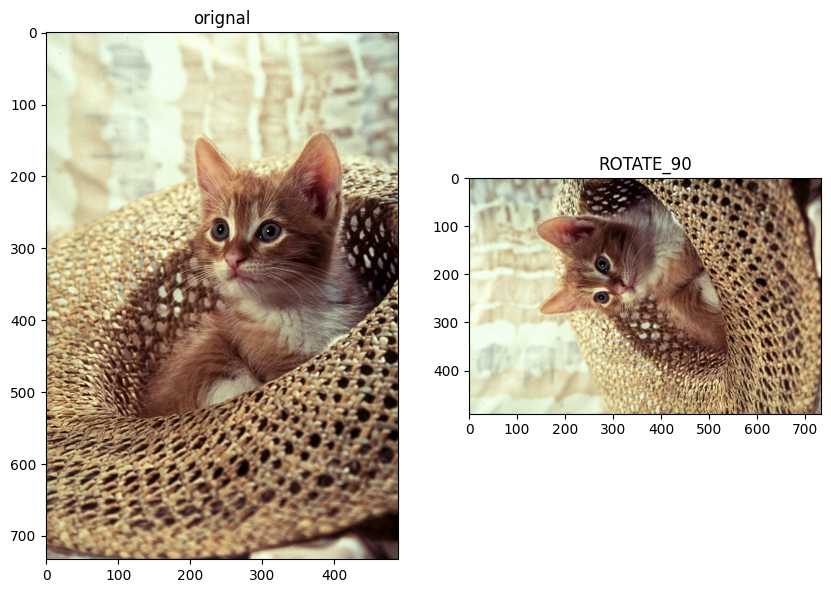

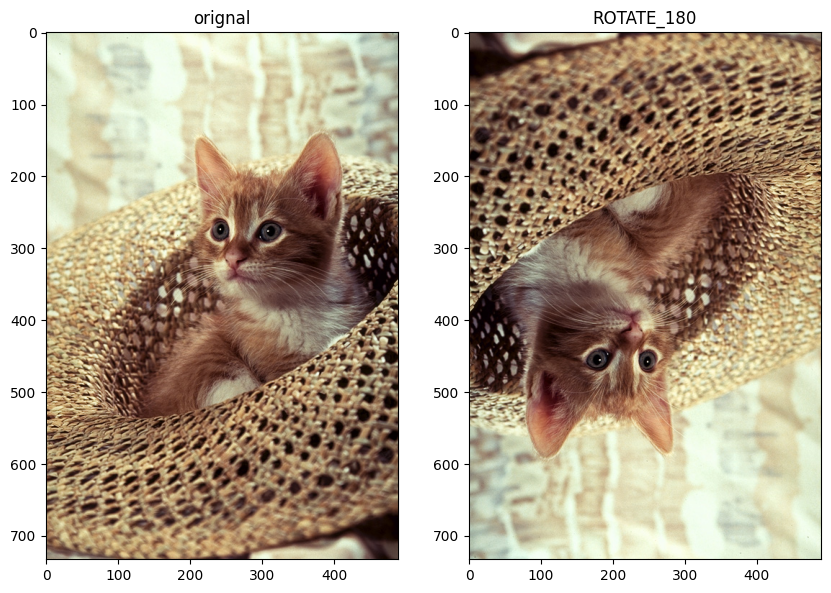

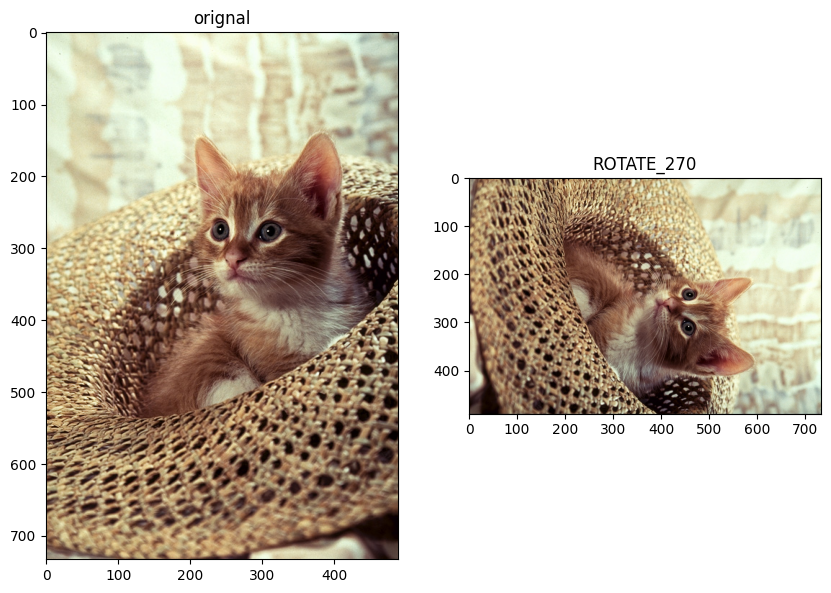

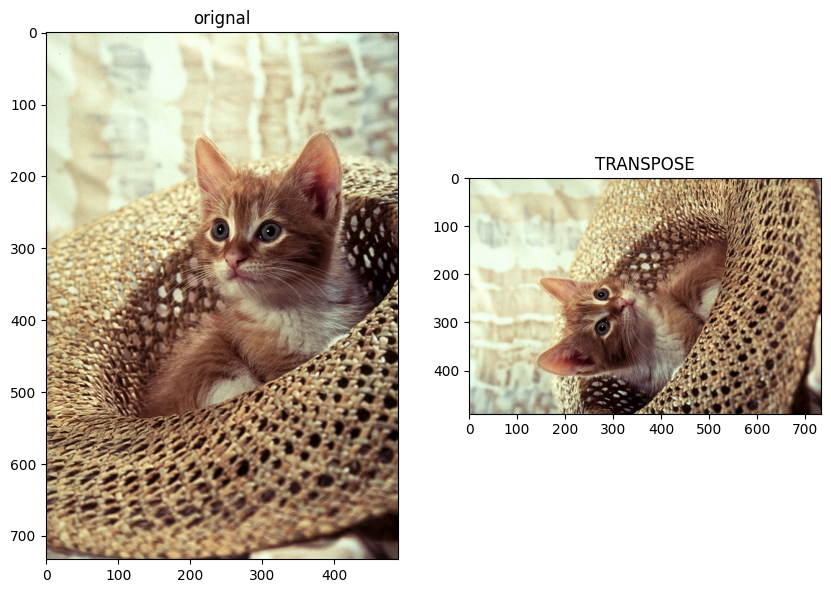

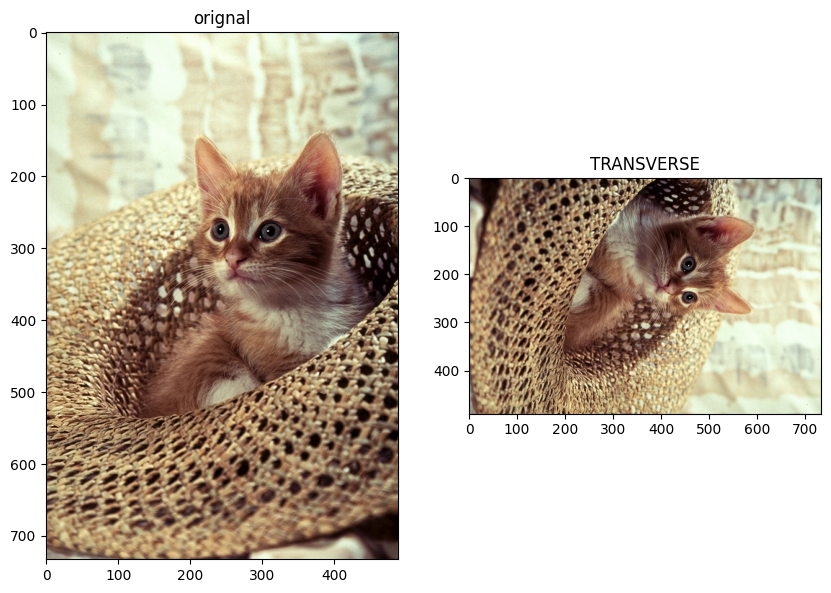

In [ ]:
for key, values in flip.items():     # Duyệt từng cặp (key, value) trong dictionary flip
                                     # key    : tên phép biến đổi (chuỗi)
                                     # values : hằng số PIL tương ứng (Image.FLIP_..., Image.ROTATE_...)

    plt.figure(figsize=(10,10))      # Tạo một figure mới để hiển thị 2 ảnh

    plt.subplot(1,2,1)               # Chia figure thành 1 hàng, 2 cột và chọn ô thứ 1 (bên trái)
    plt.imshow(image)                # Hiển thị ảnh gốc
    plt.title("orignal")             # Tiêu đề ảnh gốc (chú ý: chính tả đúng là "original")

    plt.subplot(1,2,2)               # Chọn ô thứ 2 (bên phải)
    plt.imshow(image.transpose(values))  # Áp dụng phép biến đổi tương ứng và hiển thị ảnh mới
    plt.title(key)                   # Đặt tiêu đề theo tên phép biến đổi

    plt.show()                       # Render và hiển thị cặp ảnh ra màn hình

 ## Cropping an Image


Cropping is the act of "cutting out" a part of an image and throwing out the rest. We can perform cropping using array slicing. 

Let start with a vertical crop: the variable `upper` is the index of the first row that we would like to include in the image, the variable `lower` is the index of the last row we would like to include. We then perform array slicing to obtain the new image. 


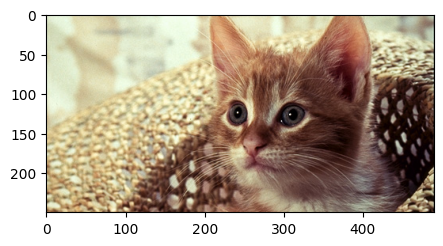

In [55]:
upper = 150                     # Chỉ số hàng bắt đầu cắt (pixel thứ 150 tính từ trên xuống)
lower = 400                     # Chỉ số hàng kết thúc cắt (pixel thứ 400)

crop_top = array[upper:lower, :, :]  
# Cắt ảnh theo chiều dọc (crop):
# - upper:lower → lấy các hàng từ 150 đến 399
# - :            → lấy toàn bộ cột (chiều ngang)
# - :            → lấy toàn bộ kênh màu (RGB)
# Kết quả là một phần ảnh nằm ở giữa theo chiều dọc

plt.figure(figsize=(5,5))       # Tạo figure mới với kích thước 5x5 inch
plt.imshow(crop_top)            # Hiển thị phần ảnh đã được crop
plt.show()                      # Render và hiển thị ảnh ra màn hình

Consider the array `crop_top`: we can also crop horizontally. The variable `right` is the index of the first column that we would like to include in the image and the variable `left` is the index of the last column we would like to include in the image.


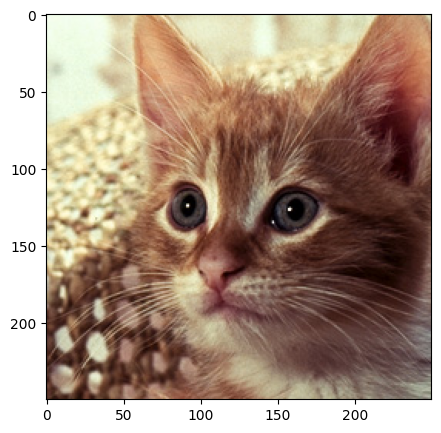

In [ ]:
left = 150                      # Cột bắt đầu cắt (tính từ trái sang)
right = 400                     # Cột kết thúc cắt

crop_horizontal = crop_top[:, left:right, :]
# Cắt ảnh theo chiều ngang:
# - :              → lấy toàn bộ hàng (chiều dọc)
# - left:right     → lấy các cột từ 150 → 399
# - :              → lấy toàn bộ kênh màu (RGB)

plt.figure(figsize=(5,5))       # Tạo figure hiển thị
plt.imshow(crop_horizontal)     # Hiển thị ảnh đã crop cả dọc + ngang
plt.show()

You can crop the PIL image using the <code>crop()</code> method, using the parameters from above Set the cropping area with <code>box=(left, upper, right, lower)</code>.


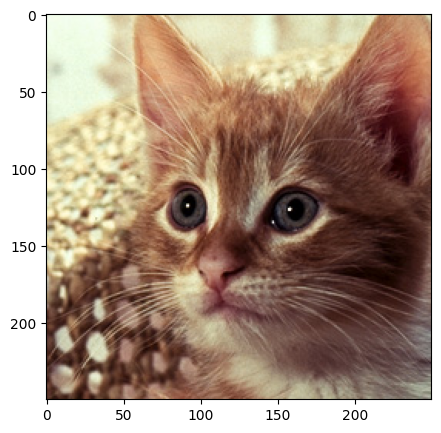

In [ ]:
image = Image.open("cat.png")     
# Mở file ảnh "cat.png" bằng thư viện PIL
# image là đối tượng PIL.Image, chưa phải mảng NumPy

crop_image = image.crop((left, upper, right, lower))
# Cắt ảnh bằng phương thức crop của PIL
# (left, upper, right, lower) là tọa độ vùng cắt:
# - left  : vị trí bắt đầu theo trục X (từ trái sang)
# - upper : vị trí bắt đầu theo trục Y (từ trên xuống)
# - right : vị trí kết thúc theo trục X
# - lower : vị trí kết thúc theo trục Y
# PIL sử dụng hệ tọa độ (x, y) với gốc ở góc trên bên trái ảnh

plt.figure(figsize=(5,5))         # Tạo một khung hiển thị mới với kích thước 5x5 inch

plt.imshow(crop_image)            # Hiển thị ảnh đã được cắt

plt.show()                        # Hiển thị ảnh ra màn hình

We can also flip the new image:


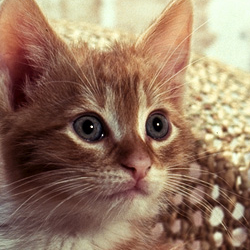

In [57]:
crop_image = crop_image.transpose(Image.FLIP_LEFT_RIGHT)
# Thực hiện phép biến đổi hình học trên ảnh PIL
# transpose(...) dùng để lật hoặc xoay ảnh
# Image.FLIP_LEFT_RIGHT:
#   → Lật ảnh theo chiều ngang (trái-phải)
#   → Giữ nguyên chiều trên–dưới
#   → Tạo ra một ảnh mới, KHÔNG thay đổi ảnh gốc trước đó

crop_image
# Dòng này khiến Notebook tự động hiển thị ảnh crop_image
# (tương đương với plt.imshow(crop_image) + plt.show())

## Changing Specific Image Pixels


We can change specific image pixels using  array indexing; for example, we can set  all the green and blue channels in the original image we cropped to zero:


In [59]:
array_sq = np.copy(array)
# Tạo một bản sao độc lập của mảng ảnh array
# array_sq có vùng nhớ khác array

array_sq[upper:lower, left:right, 1:3] = 0
# Truy cập một vùng chữ nhật trong ảnh bằng NumPy slicing:
# - upper:lower   → các hàng (chiều dọc, trục Y)
# - left:right    → các cột (chiều ngang, trục X)
# - 1:3           → kênh màu từ index 1 đến 2 (KHÔNG lấy 3)
#                   1 = Green, 2 = Red (theo thứ tự BGR/RGB tùy ảnh)
#
# Gán giá trị 0 cho 2 kênh này:
# → Chỉ giữ lại kênh 0 (Blue nếu là BGR, Red nếu là RGB)
# → Vùng hình chữ nhật sẽ hiện màu đơn sắc

We can compare the results with the new image. 


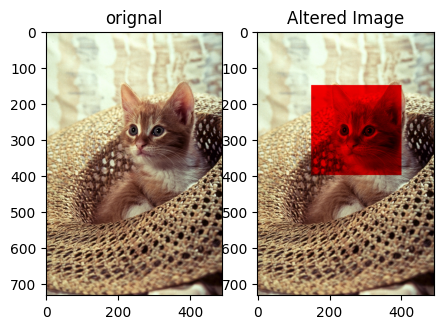

In [ ]:
plt.figure(figsize=(5,5)) # Tạo một figure mới với kích thước 5x5 inch
plt.subplot(1,2,1) # Chia figure thành 1 hàng, 2 cột. Chọn vị trí subplot thứ 1 (bên trái)
plt.imshow(array) # Hiển thị ảnh gốc (mảng NumPy array)
plt.title("orignal") # Đặt tiêu đề cho ảnh gốc

plt.subplot(1,2,2) # Chọn subplot thứ 2 (bên phải)
plt.imshow(array_sq) # Hiển thị ảnh đã bị chỉnh sửa (đã tắt kênh màu trong vùng crop)
plt.title("Altered Image") # Đặt tiêu đề cho ảnh đã thay đổi

plt.show() # Render và hiển thị toàn bộ figure

We can also use the `ImageDraw` module from `PIL` library, which provides simple 2D graphics for Image objects 


In [ ]:
from PIL import ImageDraw  
# Import module ImageDraw từ thư viện PIL
# Module này cho phép vẽ trực tiếp lên ảnh:
# - vẽ đường thẳng
# - vẽ hình chữ nhật, ellipse, polygon
# - vẽ text lên ảnh

We will copy the image object:


In [ ]:
image_draw = image.copy() # Tạo một bản sao độc lập của đối tượng ảnh PIL 'image'

The draw constructor creates an object that can be used to draw in the given image. The input <code>im</code> is the image we would like to draw in.



In [ ]:
image_fn = ImageDraw.Draw(im=image_draw)
# Tạo một đối tượng vẽ (drawing context) gắn với ảnh PIL 'image_draw'
# Mọi thao tác vẽ (rectangle, line, ellipse, text, ...) thông qua 'image_fn' sẽ được vẽ TRỰC TIẾP lên ảnh 'image_draw'

Whatever method we apply to the object <code>image_fn</code>, will change the image object <code>image_draw</code>.


We can draw a rectangle using the <code>rectangle</code> function, two important parameters include: <code>xy</code> – the coordinates bounding box  and <code>fill</code> – Color of the rectangle.


In [ ]:
shape = [left, upper, right, lower]
# Tạo danh sách 4 giá trị xác định hình chữ nhật (bounding box)
# left  : tọa độ x bên trái
# upper : tọa độ y phía trên
# right : tọa độ x bên phải
# lower : tọa độ y phía dưới

image_fn.rectangle(xy=shape, fill="red")
# Vẽ một hình chữ nhật lên ảnh 'image_draw'
# xy   : tọa độ hình chữ nhật theo dạng [x1, y1, x2, y2]
# fill : tô toàn bộ vùng bên trong hình chữ nhật bằng màu đỏ
# (không có outline → không có viền)

We can plot the image.


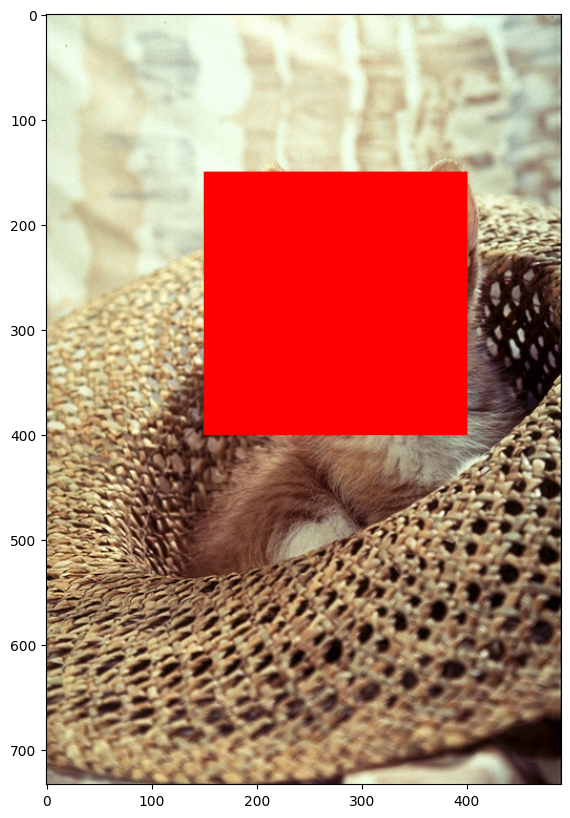

In [ ]:
plt.figure(figsize=(10,10))
# Tạo một figure mới với kích thước 10x10 inch
# Kích thước lớn giúp quan sát rõ vùng đã được vẽ (ROI)

plt.imshow(image_draw)
# Hiển thị ảnh PIL 'image_draw' (ảnh đã được vẽ hình chữ nhật màu đỏ)
# matplotlib tự động hiểu ảnh PIL ở định dạng RGB

plt.show()
# Render và hiển thị ảnh ra màn hình
# Kết thúc quá trình vẽ và hiển thị figure

There are other shapes we can use. For example, we can also overlay text on an image: we use the ImageFont module to obtain  bitmap fonts.


In [ ]:
from PIL import ImageFont
# Import module ImageFont từ thư viện PIL
# Module này dùng để:
# - Tải và quản lý font chữ (TTF, OTF)
# - Xác định kiểu chữ và kích thước chữ
# - Kết hợp với ImageDraw để vẽ text lên ảnh

We use the text method to place the text on the image. The parameters include `xy` (the top-left anchor coordinates of the text), the parameter `text` (the text to be drawn), and `fill` (the color to use for the text).


In [ ]:
image_fn.text(xy=(0,0), text="box", fill=(0,0,0))
# Vẽ chuỗi văn bản "box" lên ảnh 'image_draw'
# xy   : tọa độ (x, y) của góc trên bên trái của chữ (0,0 là góc trên-trái ảnh)
# text : nội dung chữ cần vẽ
# fill : màu chữ ở dạng RGB (0,0,0) tương ứng màu đen

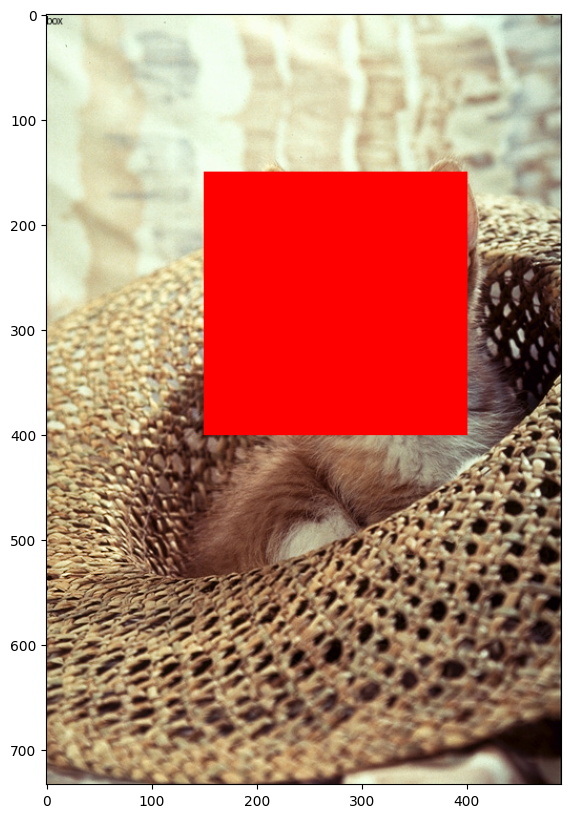

In [ ]:
plt.figure(figsize=(10,10))
# Tạo một figure mới với kích thước 10x10 inch
# Kích thước lớn giúp quan sát rõ hình chữ nhật và chữ đã được vẽ

plt.imshow(image_draw)
# Hiển thị ảnh PIL 'image_draw'
# Ảnh này là bản sao của ảnh gốc đã được:
# - vẽ hình chữ nhật màu đỏ (ROI)
# - vẽ thêm chữ "box" ở góc trên bên trái

plt.show()
# Render và hiển thị ảnh ra màn hình
# Kết thúc quá trình vẽ và hiển thị figure

We can overlay or paste one image over another by reassigning the pixel for one array to the next. Consider the following image array:


In [ ]:
image_lenna = Image.open("lenna.png")
# Mở file ảnh "lenna.png" bằng thư viện PIL
# Kết quả là một đối tượng PIL Image (chưa phải mảng số)

array_lenna = np.array(image_lenna)
# Chuyển ảnh PIL Image sang mảng NumPy
# Mỗi phần tử của mảng tương ứng với 1 pixel
# Dạng mảng thường là (height, width, channels)
# với channels = 3 cho ảnh RGB

We can reassign the pixel values as follows:


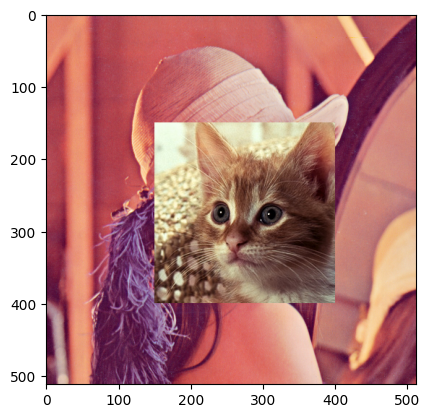

In [61]:
array_lenna[upper:lower, left:right, :] = array[upper:lower, left:right, :]
# Sao chép một vùng hình chữ nhật (ROI) từ ảnh 'array' (ví dụ ảnh cat)
# sang đúng vị trí tương ứng trong ảnh 'array_lenna'
# upper:lower  → phạm vi hàng (tọa độ y)
# left:right   → phạm vi cột (tọa độ x)
# :            → sao chép toàn bộ các kênh màu (RGB)
# Kết quả: vùng ROI trong ảnh Lenna bị thay thế bằng vùng ROI từ ảnh khác

plt.imshow(array_lenna) # Hiển thị ảnh Lenna sau khi đã bị thay thế một phần pixel bởi ảnh khác

plt.show() # Render và hiển thị ảnh ra màn hình

In the same manner, the <code>paste()</code> method allows you to overlay one image over another, with the input being the image you would like to overlay. The parameter box is the left and upper coordinate of the image:


In [ ]:
image_lenna.paste(crop_image, box=(left, upper))
# Dán (paste) ảnh 'crop_image' lên ảnh 'image_lenna'
# box=(left, upper) xác định vị trí góc trên–trái nơi ảnh con sẽ được dán
# crop_image là một ảnh PIL (đã được crop / flip trước đó)
# Kích thước của crop_image sẽ quyết định vùng bị ghi đè trên image_lenna

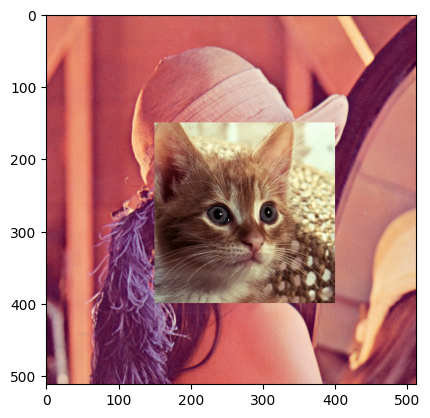

In [ ]:
plt.imshow(image_lenna)
# Hiển thị ảnh PIL 'image_lenna' sau khi đã được ghép ảnh (paste crop_image)
# matplotlib tự động xử lý ảnh PIL ở không gian màu RGB

plt.show() # Render và hiển thị ảnh ra màn hình

We can see the method `copy()` applies to some <code>PIL</code> objects. We create two image objects, we set `new_image` to the `image`, and we use the method `copy()` for the `copy_image` object.


In [ ]:
image = Image.open("cat.png")
# Mở file ảnh "cat.png" bằng thư viện PIL
# Tạo một đối tượng PIL Image chứa dữ liệu ảnh gốc

new_image = image
# Gán new_image trỏ tới cùng đối tượng ảnh với image
# new_image và image dùng chung vùng nhớ

copy_image = image.copy()
# Tạo một bản sao độc lập của ảnh 'image'
# copy_image có cùng nội dung pixel ban đầu nhưng không dùng chung vùng nhớ với image

Like the array, we see that the same memory address relationship exists. For example, if we don't use the method `copy()`, the image object has the same memory address as the original PIL image object. 


In [ ]:
id(image) == id(new_image)
# So sánh ID (địa chỉ bộ nhớ) của hai biến 'image' và 'new_image'
# id() trả về định danh duy nhất của đối tượng trong bộ nhớ

True

If we use the method <code>copy()</code>, the address is different:


In [ ]:
id(image) == id(copy_image)
# So sánh ID (địa chỉ bộ nhớ) của ảnh gốc 'image' với ảnh bản sao 'copy_image'


False

If we change the object <code>image</code>, <code>new_image</code> will change, but <code>copy_image</code> will remain the same:


In [ ]:
image_fn = ImageDraw.Draw(im=image)
# Tạo đối tượng vẽ ImageDraw gắn trực tiếp với ảnh 'image'
# Mọi thao tác vẽ sau đó sẽ làm thay đổi ảnh gốc 'image'

image_fn.text(xy=(0,0), text="box", fill=(0,0,0))
# Vẽ chữ "box" tại vị trí (0,0) lên ảnh 'image'
# fill=(0,0,0) là màu đen (RGB)
# Ảnh gốc bị ghi đè pixel tại vùng chữ

image_fn.rectangle(xy=shape, fill="red")
# Vẽ (tô kín) một hình chữ nhật màu đỏ lên ảnh 'image'
# shape = [left, upper, right, lower]
# Toàn bộ pixel trong vùng ROI bị đổi sang màu đỏ


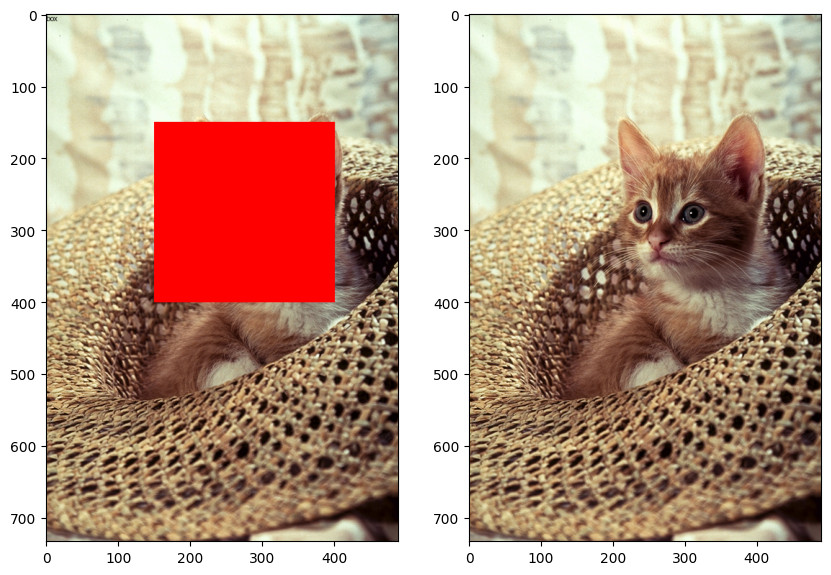

In [ ]:
plt.figure(figsize=(10,10)) # Tạo một figure mới với kích thước 10x10 inch dùng để hiển thị đồng thời 2 ảnh để so sánh

plt.subplot(121) # Chia figure thành 1 hàng, 2 cột. Chọn subplot thứ 1 (bên trái)

plt.imshow(new_image) # Hiển thị ảnh 'new_image'

plt.subplot(122) # Chọn subplot thứ 2 (bên phải)

plt.imshow(copy_image) # Hiển thị ảnh 'copy_image'

plt.show() # Render và hiển thị cả hai ảnh ra màn hình

### Question 1:
Use the image `baboon.png` from this lab or take any image you like.

Open the image and create a PIL Image object called `im`, flip `im` and create an image called `im_flip`. Mirror `im` and create an image called `im_mirror`. Finally, plot both images.


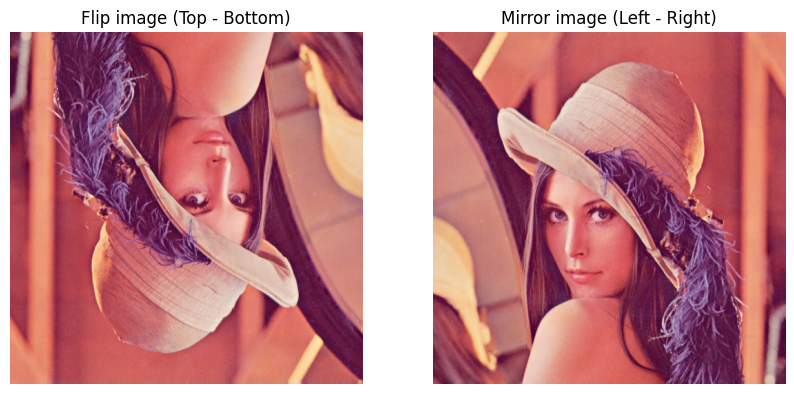

In [62]:
from PIL import Image, ImageOps
import matplotlib.pyplot as plt

# Mở ảnh gốc lenna.png
im = Image.open("lenna.png")

# Lật ảnh theo chiều dọc (đảo trục trên – dưới)
# Hàng pixel trên cùng sẽ đổi chỗ cho hàng pixel dưới cùng
im_flip = ImageOps.flip(im)

# Lật ảnh theo chiều ngang (đảo trục trái – phải)
# Cột pixel bên trái sẽ đổi chỗ cho cột pixel bên phải
im_mirror = ImageOps.mirror(im)

# Hiển thị kết quả
plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.imshow(im_flip)
plt.title("Flip image (Top - Bottom)")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(im_mirror)
plt.title("Mirror image (Left - Right)")
plt.axis("off")

plt.show()

Double-click **here** for a hint.

<!-- The hint is below:

im_flip = ImageOps.flip(im)
im_mirror = ImageOps.mirror(im)

-->


Double-click **here** for the solution.

<!-- The answer is below:

im = Image.open("lenna.png")

im_flip = ImageOps.flip(im)
plt.figure(figsize=(5,5))
plt.imshow(im_flip)
plt.show()

im_mirror = ImageOps.mirror(im)
plt.figure(figsize=(5,5))
plt.imshow(im_mirror)
plt.show()

-->


# References 


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).


<!--<h2>Change Log</h2>-->
